# How to run the python script

In [27]:
from banking_act_preprocessor import BankingActPreprocessor

preprocessor = BankingActPreprocessor()
chunks = preprocessor.get_chunks()

# Pre-processing

In [28]:
import pymupdf  
import re
import copy 
import matplotlib.pyplot as plt

In [29]:
filename = r"ba_documents/Banking Act 1970.pdf"
footer_pattern = r"Banking Act 1970 (\d+) 2020 Ed. Informal Consolidation – version in force from \d{1,2}/\d{1,2}/\d{4}|Banking Act 1970 2020 Ed. (\d+) Informal Consolidation – version in force from \d{1,2}/\d{1,2}/\d{4}|Informal Consolidation – version in force from \d{1,2}/\d{1,2}/\d{4} (\d+) 2020 Ed."

# Data Loading

In [30]:
# Load the Banking Act PDF
doc = pymupdf.open(filename)

In [31]:
def get_full_text(page_start, page_end, doc=doc):
    full_text = ''
    for page_num in range(page_start, page_end):  
        # Load the page
        page = doc.load_page(page_num)  
        # Load text 
        text = page.get_text("text")  
        # Remove line break
        text = re.sub(r'\n+', ' ', text)
        # Remove footer 
        text = re.sub(footer_pattern, "", text)
        text = text.strip() + " "

        full_text = full_text + text
        print(f"Page {page_num}:") 
        print(text) 
        print("-" * 50)
    return full_text
    

In [32]:
# Extract the table of contents
toc_text = get_full_text(1, 8)

Page 1:
Banking Act 1970 ARRANGEMENT OF SECTIONS PART 1 PRELIMINARY Section 1. Short title 2. Interpretation PART 2 APPOINTMENT OF ASSISTANTS 3. Appointment of assistants PART 3 LICENSING OF BANKS 4. Licensing of banks 4A. Restriction on deposit-taking business and soliciting deposits 4B. Application of section 4A 4C. Examination of persons suspected of contravening section 4A and access to premises 5. Use of word “bank” 5A. Use of bank name, etc. 6. Examination of persons suspected of transacting banking business and access to premises 7. Application for bank licence or variation of condition as to banking business 8. Licence fees 9. Minimum capital requirements 9A. Capital requirements for qualifying subsidiaries 10. Risk-based capital requirements 10A. Leverage ratio requirement 10B. Public disclosure requirement 10C. Stable funding requirement 11. [Repealed] 11A. Appeal to Minister 
--------------------------------------------------
Page 2:
Section 12. New place of business and cha

In [33]:
def parse_toc(text):
    # Split the string into parts
    parts = re.split(r'PART \d+[A-Z]?', text)[1:]
    part_titles_matches = re.findall(r'PART (\d+[A-Z]?) (.+?)(?=PART \d+[A-Z]?|$)', text, re.DOTALL)
    
    parsed_toc = []
    
    for part_match, part_content in zip(part_titles_matches, parts):
        part_id, part_title = part_match
        
        # Regex to handle complex section IDs like 48AA
        sections = re.findall(r'(\d+[A-Z]*)\.\s*(.+?)(?=\d+[A-Z]*\.|$)', part_content.strip(), re.DOTALL)
        # Extract only the uppercase letters which denote the part title 
        match = re.search(r'\b[A-Z\s,.]+\b', part_title)
        part_title = match.group() if match else part_title
        
        for section_id, section_title in sections:
            section_title = section_title.strip()
            # Remove 'Section' placeholder at the end of section title 
            section_title = re.sub(r'\bSection\b$', '', section_title)
            # Remove Division from section_title
            section_title = re.sub(r'Division \d+ —.*', '', section_title)
            # Clean last section to exclude unnecessary text
            if section_id == '79':
                section_title = re.split(r' First Schedule', section_title)[0]
            
            parsed_toc.append({
                "part_id": part_id.strip(),
                "part_title": part_title.strip(),
                "section_id": section_id.strip(),
                "section_title": section_title.strip()
            })
    
    return parsed_toc

In [34]:
toc_list = parse_toc(toc_text)
toc_list[:5]

[{'part_id': '1',
  'part_title': 'PRELIMINARY',
  'section_id': '1',
  'section_title': 'Short title'},
 {'part_id': '1',
  'part_title': 'PRELIMINARY',
  'section_id': '2',
  'section_title': 'Interpretation'},
 {'part_id': '2',
  'part_title': 'APPOINTMENT OF ASSISTANTS',
  'section_id': '3',
  'section_title': 'Appointment of assistants'},
 {'part_id': '3',
  'part_title': 'LICENSING OF BANKS',
  'section_id': '4',
  'section_title': 'Licensing of banks'},
 {'part_id': '3',
  'part_title': 'LICENSING OF BANKS',
  'section_id': '4A',
  'section_title': 'Restriction on deposit-taking business and soliciting deposits'}]

In [35]:
toc_sections = [d['section_id'] for d in toc_list]
print(toc_sections)

['1', '2', '3', '4', '4A', '4B', '4C', '5', '5A', '6', '7', '8', '9', '9A', '10', '10A', '10B', '10C', '11', '11A', '12', '13', '13A', '14', '14A', '14B', '14C', '15', '15A', '15B', '15C', '15D', '15E', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '29A', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '39A', '40', '40A', '41', '42', '43', '44', '44A', '45', '46', '46A', '46B', '47', '47A', '48', '48AA', '48A', '49', '50', '51', '52', '53', '53A', '54', '54A', '54B', '55', '55A', '55B', '55BA', '55C', '55D', '55E', '55F', '55G', '55H', '55I', '55J', '55K', '55L', '55M', '55N', '55O', '55P', '55Q', '55R', '55S', '55T', '55U', '55V', '55W', '55X', '55Y', '55Z', '55ZA', '55ZB', '55ZC', '55ZD', '55ZE', '55ZF', '55ZG', '55ZH', '55ZI', '55ZJ', '55ZK', '55ZL', '56', '57', '57A', '57B', '57C', '57D', '57E', '57EA', '57EB', '57F', '57FA', '57FB', '57FC', '57FD', '57FE', '57G', '58', '59', '60', '61', '62', '62A', '62B', '63', '64', '65', '65A', 

In [36]:
# Extract the full content text
contents_text = get_full_text(8, doc.page_count)

Page 8:
PART 1 PRELIMINARY Short title 1. This Act is the Banking Act 1970. Interpretation 2.—(1) In this Act, unless the context otherwise requires — “agreement” means an agreement whether formal or informal and whether express or implied; “Authority” means the Monetary Authority of Singapore established under the Monetary Authority of Singapore Act 1970; “bank” means any company which holds a valid bank licence under section 7 or 79; “bank in Singapore” means — (a) a bank incorporated in Singapore; or (b) in the case of a bank incorporated outside Singapore, the branches and offices of the bank located within Singapore; “bank incorporated outside Singapore” means a bank incorporated, formed or established outside Singapore; “banking business” means the business of receiving money on current or deposit account, paying and collecting cheques drawn by or paid in by customers, the making of advances to customers, and includes such other business as the Authority may prescribe for the pur

# Chunking 

In [37]:
def split_subsections(text):
    # Split by parts 
    part_pattern = re.split(r'(?=PART \d+)', text)

    output = {'chunks': [], 
              'chunks_length': [], 
              'ids': [], 
              'section_dict': {}}

    id_prefix = 'ba-1970-'
    regulation = 'Banking Act 1970'

    for part_text in part_pattern[1:12]:
        part_id = part_text.split(' ')[1]
        print('Part ', part_id)
        toc_sections = [item for item in toc_list if item['part_id'] == part_id]
        n_sections = len(toc_sections)
        
        # Split by sections
        for id, toc_section in enumerate(toc_sections):
            # print(id+1, n_sections, toc_section)

            section_id = toc_section["section_id"]
            section_title = toc_section["section_title"]
            print('Section ', section_id, section_title)
            if id+1 < n_sections: 
                next_section_id = toc_sections[id+1]["section_id"]
                next_section_title = toc_sections[id+1]["section_title"]
                # print(next_section_id, next_section_title)

                if ('Repealed' not in section_title) and ('Repealed' in next_section_title):
                    match = re.search(rf'{section_title} {section_id}\.(.*?){next_section_id}\.', part_text)
                elif ('Repealed' in section_title) and ('Repealed' not in next_section_title):
                    match = re.search(rf'{section_id}\.(.*?){next_section_title} {next_section_id}\.', part_text)
                elif ('Repealed' in section_title) and ('Repealed' in next_section_title):
                    match = re.search(rf'{section_id}\.(.*?){next_section_id}\.', part_text)
                else: 
                    match = re.search(rf'{section_title} {section_id}\.(.*?){next_section_title} {next_section_id}\.', part_text)

            # handle last section        
            else:  
                if ('Repealed' in section_title):
                    match = re.search(rf'{section_id}\.(.*)', part_text)
                else: 
                    match = re.search(rf'{section_title} {section_id}\.(.*)', part_text)

            print(part_text)
            section_text = match.group(1).strip()
            section_text = f'{section_id}. {section_text}'

            if section_id == '79':
                    section_text = re.split(r' FIRST SCHEDULE', section_text)[0]
            # print(section_text, '\n')

            delimiters = re.findall(r'(?:\. |—|] )\(\d+[A-Za-z]?\)', section_text)
            subsections_list = [x.replace('—','').replace('.','').replace(']', '').strip() for x in delimiters]
            # print('Delimiters:', delimiters)
            # print('Subsection:', subsections_list)
            # print('\n')

            # Chunk by subsection
            toc_section['regulation'] = regulation
            toc_section['references'] = []
            toc_section['part_title'] = toc_section['part_title'].capitalize()
            toc_section['section_id'] = section_id.lower()

            #If no subsection, take section as the smallest chunk
            if len(subsections_list) == 0: 
                # toc_section['references'] = extract_references(section_text)
                chunk_id = (id_prefix + section_id).lower()
                chunk = {
                    "id": chunk_id, 
                    "text": section_text,
                    "metadata": toc_section
                }

                raw_sid = chunk['metadata']['section_id']
                formatted_sid = f'{id_prefix}{raw_sid}'
                if formatted_sid not in output['section_dict'].keys():
                    output['section_dict'][formatted_sid] = []
                output['section_dict'][formatted_sid].append(chunk['id'])

                print(chunk)
                output['chunks'].append(chunk)
                output['chunks_length'].append(len(section_text))
                output['ids'].append(chunk_id)
                
                # print(f'Chunk length: {len(section_text)}')
                # print(section_text, '\n')

            else:
                # print(section_text)
                for i in range(len(subsections_list)):
                    delimiter_start = delimiters[i]
                    subsection_start = subsections_list[i]
                    if i+1 < len(subsections_list):
                        delimiter_end = delimiters[i+1]
                        subsection_end = subsections_list[i+1]

                        match = re.search(rf'({re.escape(delimiter_start)}.*?{re.escape(delimiter_end)})', section_text)
                        subsection_text = match.group(1).strip()
                        
                        subsection_text = subsection_text.replace(delimiter_start, subsection_start)
                        subsection_text = re.sub(rf'\s*{re.escape(subsection_end)}$', '', subsection_text).strip() 
                    else: 
                        match = re.search(rf'{re.escape(delimiter_start)}(.*)', section_text)
                        subsection_text = match.group(1).strip()
                        subsection_text = f'{subsection_start} {subsection_text}'
                    
                    subsection_text = section_id + subsection_text
                    
                    subsection_id = subsection_start.replace("(", "").replace(")", "")

                    # toc_section['references'] = extract_references(subsection_text)
                    chunk_id = (f'{id_prefix}{section_id}.{subsection_id}').lower()

                    chunk = {
                        "id": chunk_id, 
                        "text": subsection_text,
                        "metadata": toc_section
                    }

                    raw_sid = chunk['metadata']['section_id']
                    formatted_sid = f'{id_prefix}{raw_sid}'
                    if formatted_sid not in output['section_dict'].keys():
                        output['section_dict'][formatted_sid] = []
                    output['section_dict'][formatted_sid].append(chunk['id'])

                    print(chunk)
                    output['chunks'].append(chunk)
                    output['chunks_length'].append(len(subsection_text))
                    output['ids'].append(chunk_id)

                    # print(f'Chunk length: {len(subsection_text)}')
                    # print(subsection_text, '\n')
            
            print('--------------')  
    
    return output

In [38]:
subsections_dict = split_subsections(contents_text)
raw_chunks = subsections_dict['chunks']
chunks_length = subsections_dict['chunks_length']
chunks_id = subsections_dict['ids']
section_dict = subsections_dict['section_dict']

Part  1
Section  1 Short title
PART 1 PRELIMINARY Short title 1. This Act is the Banking Act 1970. Interpretation 2.—(1) In this Act, unless the context otherwise requires — “agreement” means an agreement whether formal or informal and whether express or implied; “Authority” means the Monetary Authority of Singapore established under the Monetary Authority of Singapore Act 1970; “bank” means any company which holds a valid bank licence under section 7 or 79; “bank in Singapore” means — (a) a bank incorporated in Singapore; or (b) in the case of a bank incorporated outside Singapore, the branches and offices of the bank located within Singapore; “bank incorporated outside Singapore” means a bank incorporated, formed or established outside Singapore; “banking business” means the business of receiving money on current or deposit account, paying and collecting cheques drawn by or paid in by customers, the making of advances to customers, and includes such other business as the Authority ma

# Metadata Extraction: References

In [39]:
# Format: 1AA(1AA)(a)(i)(A)
# section -> sub-section -> paragraph -> sub-paragraph -> item inside sub-paragraph 
codes = ['4', '4A', '12AA', '4(1)', '12AA(13AA)', '12(1)(a)(A)', '(2)', '(2AA)(a)', '(2)(a)(i)', '(2)(a)(i)(A)', '(a)', '(a)(ii)', '(a)(ix)(C)']
pattern = r"^(?:\d+[A-Z]{0,2}(\(\d+[A-Z]{0,2}\))?(\([a-z]\))?(\(\b[ivxlcdm]+\b\))?(\(\b[A-Z]+\b\))?$)|((\(\d+[A-Z]{0,2}\))(\([a-z]\))?(\(\b[ivxlcdm]+\b\))?(\(\b[A-Z]+\b\))?$)|((\([a-z]\))(\(\b[ivxlcdm]+\b\))?(\(\b[A-Z]+\b\))?$)"
for code in codes:
    print(code, bool(re.fullmatch(pattern, code)))

4 True
4A True
12AA True
4(1) True
12AA(13AA) True
12(1)(a)(A) True
(2) True
(2AA)(a) True
(2)(a)(i) True
(2)(a)(i)(A) True
(a) True
(a)(ii) True
(a)(ix)(C) True


In [40]:
# text_1 = '4B(10) In this section and next section — “close relative”, in relation to a person, means the spouse or a parent, ' \
# 'remoter lineal ancestor or section 7 and 79. step-parent or a son, daughter, remoter issue, stepson or stepdaughter or a brother or sister, of the person; ' \
# '“controller” means a 12% controller or 20% controller as defined in section 15B(3); “debentures” has the meaning given by section 4(1) of the Companies Act 1967; ' \
# '“securities” has the meaning given by section 2(1) of the Securities and Futures Act 2001.'
# text_2 = '16(1) Without subsection (2)(a) affecting section 17, if the subsection (2)(a) Minister is section 15A, 15B, 15C(4) or 15E(5) or has ' \
# 'failed section 15C(2) or (5), or if meaning given by section 2(1) of the Securities and Futures Act 2001.'

text = '4A(16AB) This is a sample text with a lot of sections section 15A, 15B(1)(a)(i) or (2)(a) or 15C(4)(a), (b), (c) and 15D(1)(d) is a subsection (2)(a)(i)(B), (ii) and (iii) ' \
'and or of subsection (4)(a), (b) or (c) such that section 27(2)(a), (b)(i)(A), (c), (d), (3)(e), (f), (h), (i) or (5)(j) section 4A(1) or (2) ' \
'Sections 4A(3), (4) and (7) or 4B(1), (2) and (3) subsection (1) and (2) section 15A(2) or (4) or 15B(2) section 15A, 15B(1)(a) or (2)(a) or 15C(4)(a)'

def extract_references(text):
    keywords = ['section', 'sections', 'subsection', 'subsections']
    split_text = text.split(' ')
    references = []
    for i, word in enumerate(split_text): 
        if word.lower() in keywords:
            # Check if next word is a section/subsection number 
            save_reference = word
            for j, word in enumerate(split_text[i+1:]):
                pattern = r"^(?:\d+[A-Z]{0,2}(\(\d+[A-Z]{0,2}\))?(\([a-z]\))?(\(\b[ivxlcdm]+\b\))?(\(\b[A-Z]+\b\))?$)|((\(\d+[A-Z]{0,2}\))(\([a-z]\))?(\(\b[ivxlcdm]+\b\))?(\(\b[A-Z]+\b\))?$)|((\([a-z]\))(\(\b[ivxlcdm]+\b\))?(\(\b[A-Z]+\b\))?$)|^(and|or|to)$"
                cleaned_word = re.sub(r"(,|;|\.)?\s*$", "", word).strip()
                if bool(re.fullmatch(pattern, cleaned_word)):
                    save_reference = ' '.join([save_reference, word])
                elif j == 0: # if the first next word doesn't match, it's standalone keyword (e.g: 'in this section')
                    save_reference = ''
                    break
                elif cleaned_word == 'of': # reference to other Act 
                    save_reference = ''
                else: 
                    break
            save_reference = re.sub(r"(,|, or|;|\.|or|and|to|, to)?\s*$", "", save_reference, flags=re.IGNORECASE).strip()
            # print(save_reference)

            if save_reference.lower() not in [''] + keywords:
                references.append(save_reference)
    references = list(dict.fromkeys(references))
    return references
                
extracted_references = extract_references(text)
extracted_references

['section 15A, 15B(1)(a)(i) or (2)(a) or 15C(4)(a), (b), (c) and 15D(1)(d)',
 'subsection (2)(a)(i)(B)',
 'subsection (4)(a), (b) or (c)',
 'section 27(2)(a), (b)(i)(A), (c), (d), (3)(e), (f), (h), (i) or (5)(j)',
 'section 4A(1) or (2)',
 'Sections 4A(3), (4) and (7) or 4B(1), (2) and (3)',
 'subsection (1) and (2)',
 'section 15A(2) or (4) or 15B(2)',
 'section 15A, 15B(1)(a) or (2)(a) or 15C(4)(a)']

In [41]:
def truncate_references(references):
    output = []
    for text in references:
        # only keep until subsection e.g: 15B(1)(a)(i)(A) -> 15B(1)
        cleaned_text = re.sub(r'\(\b[a-z]+\b\)', '', text)  # Remove lowercase letters in brackets
        cleaned_text = re.sub(r'\(\b[ivxlcdm]+\b\)', '', cleaned_text, flags=re.IGNORECASE)  # Remove Roman numerals in brackets
        cleaned_text = re.sub(r'\(\b[A-Z]+\b\)', '', cleaned_text, flags=re.IGNORECASE)  # Remove capital letter in brackets
        # Clean trailing commas and whitespaces
        cleaned_text = re.sub(r'( ,)', '', cleaned_text)
        cleaned_text = re.sub(r'(,|,\s+(and|or|to)|;|\.|or|and|to|, to)?\s*$', '', cleaned_text, flags=re.IGNORECASE)
        cleaned_text = cleaned_text.replace('  ', ' ')
        output.append(cleaned_text.strip())  # Remove extra spaces
    return output

truncated_references = truncate_references(extracted_references)
truncated_references

['section 15A, 15B(1) or (2) or 15C(4), and 15D(1)',
 'subsection (2)',
 'subsection (4)',
 'section 27(2), (3), or (5)',
 'section 4A(1) or (2)',
 'Sections 4A(3), (4) and (7) or 4B(1), (2) and (3)',
 'subsection (1) and (2)',
 'section 15A(2) or (4) or 15B(2)',
 'section 15A, 15B(1) or (2) or 15C(4)']

In [42]:
def insert_sections(references):
    expanded_section = []
    for reference in references: 
        keywords = ['section', 'sections'] 
        split_text = reference.split(' ')

        # skip if it is not a section 
        if split_text[0].lower() not in keywords:
            expanded_section.append(reference)
            continue

        # print(split_text)
        section_id = '' # store the section_id to be inserted to standalone subsection_id 
        expanded_text = [split_text[0]]
        for word in split_text[1:]:
            cleaned_word = re.sub(r"(,|;|\.)?\s*$", "", word).strip()
            pattern_section = r"^(?:\d+[A-Z]{0,2}|(\d+[A-Z]{0,2})(\(\d+[A-Z]{0,2}\))?(\([a-z]\))?(\(\b[ivxlcdm]+\b\))?(\(\b[A-Z]+\b\))?$)"
            match_section = re.match(pattern_section, cleaned_word)

            pattern_subsection = r"(?:\(\d+[A-Z]{0,2}\)|\(\d+[A-Z]{0,2}\)(\([a-z]\))?(\(\b[ivxlcdm]+\b\))?(\(\b[A-Z]+\b\))?$)" 
            match_subsection = re.match(pattern_subsection, cleaned_word)

            if match_section: 
                section_id = match_section.group(0)
                expanded_text.append(word) #section doesn't change 
                # print(section_id)
            elif match_subsection:
                subsection_id = match_subsection.group(0)
                subsection_id = section_id + subsection_id
                expanded_text.append(subsection_id) #inserted section_id 
                # print(subsection_id)
            else: 
                expanded_text.append(word)
        expanded_text = ' '.join(expanded_text)
        expanded_section.append(expanded_text)
    return expanded_section

section_inserted_references = insert_sections(truncated_references)
section_inserted_references


['section 15A, 15B(1) or 15B(2) or 15C(4), and 15D(1)',
 'subsection (2)',
 'subsection (4)',
 'section 27(2), 27(3) or 27(5)',
 'section 4A(1) or 4A(2)',
 'Sections 4A(3), 4A(4) and 4A(7) or 4B(1), 4B(2) and 4B(3)',
 'subsection (1) and (2)',
 'section 15A(2) or 15A(4) or 15B(2)',
 'section 15A, 15B(1) or 15B(2) or 15C(4)']

In [43]:
def reformat_references(references, section_id, prefix='ba-1970'):
    result = []
    
    for reference in references:
        # Find all patterns that resemble section/subsection identifiers
        reference = reference.lower()
        # print(reference)

        # Reformat section 15b(1) -> 15b.1
        if 'subsection' not in reference: 
            pattern = r'(\d+[a-z]*)(?:\((\d+[a-z]*)\))?'
            matches = re.findall(pattern, reference)
            # print(matches)
            
            for match in matches:
                section_part = match[0].lower()  # Convert section part to lowercase
                subsection_part = match[1] if match[1] else None 
                # print(section_part, subsection_part, '\n')
                
                # If subsection exists, format accordingly
                if subsection_part:
                    result.append(f'{prefix}-{section_part}.{subsection_part.lower()}')
                else:
                    result.append(f'{prefix}-{section_part}')
        else: 
            subsections_id = re.findall(r'\((.*?)\)', reference)
            for sid in subsections_id:
                # print(sid)
                result.append(f'{prefix}-{section_id}.{sid}'.lower())
    return result

list_references = reformat_references(section_inserted_references, 1, prefix='ba-1970')
list_references

['ba-1970-15a',
 'ba-1970-15b.1',
 'ba-1970-15b.2',
 'ba-1970-15c.4',
 'ba-1970-15d.1',
 'ba-1970-1.2',
 'ba-1970-1.4',
 'ba-1970-27.2',
 'ba-1970-27.3',
 'ba-1970-27.5',
 'ba-1970-4a.1',
 'ba-1970-4a.2',
 'ba-1970-4a.3',
 'ba-1970-4a.4',
 'ba-1970-4a.7',
 'ba-1970-4b.1',
 'ba-1970-4b.2',
 'ba-1970-4b.3',
 'ba-1970-1.1',
 'ba-1970-1.2',
 'ba-1970-15a.2',
 'ba-1970-15a.4',
 'ba-1970-15b.2',
 'ba-1970-15a',
 'ba-1970-15b.1',
 'ba-1970-15b.2',
 'ba-1970-15c.4']

In [44]:
def map_sections(list_references, section_dict):
    final_ref = []
    for ref in list_references:
        if ref in section_dict.keys():
            for id in section_dict[ref]:
                final_ref.append(id)
        else: 
            final_ref.append(ref)
    final_ref = list(dict.fromkeys(final_ref)) # remove duplicates 
    return final_ref

mapped_references = map_sections(list_references, section_dict)
mapped_references

['ba-1970-15a.1',
 'ba-1970-15a.2',
 'ba-1970-15a.3',
 'ba-1970-15a.4',
 'ba-1970-15a.5',
 'ba-1970-15b.1',
 'ba-1970-15b.2',
 'ba-1970-15c.4',
 'ba-1970-15d.1',
 'ba-1970-1.2',
 'ba-1970-1.4',
 'ba-1970-27.2',
 'ba-1970-27.3',
 'ba-1970-27.5',
 'ba-1970-4a.1',
 'ba-1970-4a.2',
 'ba-1970-4a.3',
 'ba-1970-4a.4',
 'ba-1970-4a.7',
 'ba-1970-4b.1',
 'ba-1970-4b.2',
 'ba-1970-4b.3',
 'ba-1970-1.1']

In [45]:
def get_references(raw_chunks, section_dict):
    chunks = []
    for chunk in raw_chunks: 
        text = chunk['text']
        id = chunk['id']
        print("Processing chunk ID:", id)
        print("Text:", text)
        
        section_id = chunk['metadata']['section_id']

        # Process references
        raw_references = extract_references(text)
        truncated_references = truncate_references(raw_references)
        expanded_references = insert_sections(truncated_references)
        formatted_references = reformat_references(expanded_references, section_id=section_id)
        final_references = map_sections(formatted_references, section_dict)

        # Debugging prints
        print("Raw References:", raw_references)
        if len(raw_references) > 0:
            print("Truncated:", truncated_references)
            print("Expanded:", expanded_references)
            print("Formatted:", formatted_references)
            print("Final References:", final_references)

        chunk['metadata']['references'] = final_references
        print("Updated Metadata:", chunk['metadata'])  
        
        # Ensure the updated chunk is correctly stored
        chunks.append(copy.deepcopy(chunk))  
        
        print("\n")

    return chunks

In [46]:
final_chunks = get_references(raw_chunks, section_dict)

Processing chunk ID: ba-1970-1
Text: 1. This Act is the Banking Act 1970.
Raw References: []
Updated Metadata: {'part_id': '1', 'part_title': 'Preliminary', 'section_id': '1', 'section_title': 'Short title', 'regulation': 'Banking Act 1970', 'references': []}


Processing chunk ID: ba-1970-2.1
Text: 2(1) In this Act, unless the context otherwise requires — “agreement” means an agreement whether formal or informal and whether express or implied; “Authority” means the Monetary Authority of Singapore established under the Monetary Authority of Singapore Act 1970; “bank” means any company which holds a valid bank licence under section 7 or 79; “bank in Singapore” means — (a) a bank incorporated in Singapore; or (b) in the case of a bank incorporated outside Singapore, the branches and offices of the bank located within Singapore; “bank incorporated outside Singapore” means a bank incorporated, formed or established outside Singapore; “banking business” means the business of receiving money

In [47]:
final_chunks

[{'id': 'ba-1970-1',
  'text': '1. This Act is the Banking Act 1970.',
  'metadata': {'part_id': '1',
   'part_title': 'Preliminary',
   'section_id': '1',
   'section_title': 'Short title',
   'regulation': 'Banking Act 1970',
   'references': []}},
 {'id': 'ba-1970-2.1',
  'text': '2(1) In this Act, unless the context otherwise requires — “agreement” means an agreement whether formal or informal and whether express or implied; “Authority” means the Monetary Authority of Singapore established under the Monetary Authority of Singapore Act 1970; “bank” means any company which holds a valid bank licence under section 7 or 79; “bank in Singapore” means — (a) a bank incorporated in Singapore; or (b) in the case of a bank incorporated outside Singapore, the branches and offices of the bank located within Singapore; “bank incorporated outside Singapore” means a bank incorporated, formed or established outside Singapore; “banking business” means the business of receiving money on current or d

In [48]:
chunks

[{'id': 'ba-1970-1',
  'text': '1. This Act is the Banking Act 1970.',
  'metadata': {'part_id': '1',
   'part_title': 'Preliminary',
   'section_id': '1',
   'section_title': 'Short title',
   'regulation': 'Banking Act 1970',
   'references': []}},
 {'id': 'ba-1970-2.1',
  'text': '2(1) In this Act, unless the context otherwise requires — “agreement” means an agreement whether formal or informal and whether express or implied; “Authority” means the Monetary Authority of Singapore established under the Monetary Authority of Singapore Act 1970; “bank” means any company which holds a valid bank licence under section 7 or 79; “bank in Singapore” means — (a) a bank incorporated in Singapore; or (b) in the case of a bank incorporated outside Singapore, the branches and offices of the bank located within Singapore; “bank incorporated outside Singapore” means a bank incorporated, formed or established outside Singapore; “banking business” means the business of receiving money on current or d

In [49]:
final_chunks == chunks

True

In [50]:
# Check if all the references mapped to existing ids 
is_found = True 
for chunk in final_chunks:
    id = chunk['id']
    references = chunk['metadata']['references']
    for ref in references: 
        if ref not in chunks_id:
            print(f'chunk_id: {id}, reference: {ref}')
            is_found = False 

print(is_found)

True


In [51]:
# Check length of chunk content 
chunk_max_len = max(chunks_length)
print(f'Max length: {chunk_max_len}')
long_chunks = [c for c in chunks_length if c >=5000]
print(f'Chunks with length >= 5000: {long_chunks}')

Max length: 10246
Chunks with length >= 5000: [10246]


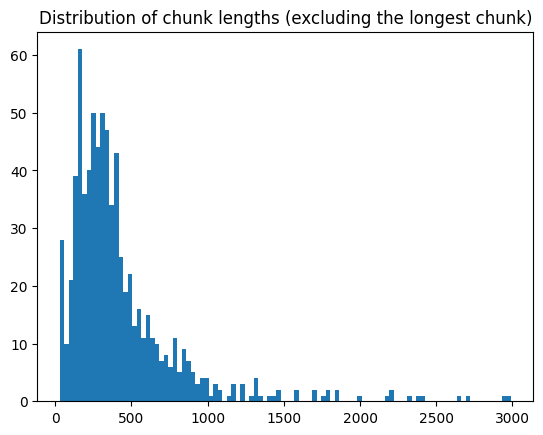

In [52]:
chunk_length_ = [c for c in chunks_length if c < max(chunks_length)]
plt.hist(chunk_length_, bins=100)
plt.title('Distribution of chunk lengths (excluding the longest chunk)')
plt.show()